## Importing all packages required that will lead to the final result.

In [1]:
#%%
import os

#https://plotly.com/python/getting-started/
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly as py

from plotly import offline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns


path = '/Users/ismailali/Desktop/Project1# stock exchange data/'
dirs_csv_only = list(filter(lambda x: x.endswith('.csv'), os.listdir(path)))

df = pd.read_csv('/Users/ismailali/Desktop/Project1# stock exchange data/indexData.csv')
processed = pd.read_csv('/Users/ismailali/Desktop/Project1# stock exchange data/indexProcessed.csv')
info = pd.read_csv('/Users/ismailali/Desktop/Project1# stock exchange data/indexInfo.csv')

## In this project I used the CRISP-DM process to analyze the Stock Exchange Data (https://www.kaggle.com/datasets/mattiuzc/stock-exchange-data):

<b>-Business Understanding</b> <br>
<b>-Data Understanding</b> <br>
<b>-Prepare Data</b> <br>
<b>-Data Modeling</b> <br>
<b>-Evaluate the Results</b> <br>
<b>-Deploy</b> <br>

# Business understanding.

My goal is to explore and analyze the dataset, have a better understanding about the trend of the opening, closing, maximum and minimum indexes values over time, study the volatility and finally find which index is more profitable.
I started an analysis at the general level of the dataset, through comparison graphs of all indexes and then went into the actual analysis. I answered the following questions: <br>
<b>-A general overview of which nations had a large number of stocks in a certain range.</b> <br>
<b>-Overview comparison about Open and Close indexes values over the time.</b> <br>
<b>-Comparison between the two indexes on the volume.</b>  <br>
<b>-Comparison between the two countries on the volume multiplied by the opening value.</b>  <br>
<b>-Comparison between the two indexes on the difference between the opening and closing value.</b>  <br>
<b>-Comparison between the two indexes on the difference between the highest and lowest value.</b>  <br>
<b>-Which indices is more volatile? </b>  <br>
<b>-Through an OHLC, see the differences, if any.</b>  <br>
<b>-Which indices has the most high value in return investment.</b>  <br>

# Exploratory Data Analysis.

## Prepare Data.

## All CSV files in the stock exchange data folder.

In [2]:
for f in dirs_csv_only:
    print(f, sep ='\n')

indexInfo.csv
indexProcessed.csv
indexData.csv


# Cleaning data.


## Drop any NaN values.

In [3]:
df.dropna(inplace=True)
df.reset_index(drop = True, inplace = True)

In [4]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,110253.000000,110253.000000,110253.000000,110253.000000,110253.000000,1.102530e+05
mean,7658.515222,7704.372961,7608.000422,7657.545872,7657.351729,1.273975e+09
std,9011.478913,9066.638548,8954.506981,9011.510444,9011.608900,4.315783e+09
min,54.869999,54.869999,54.869999,54.869999,54.869999,0.000000e+00
25%,1855.030029,1864.510010,1843.979980,1855.060059,1854.179565,0.000000e+00
50%,5194.089844,5226.279785,5154.049805,5194.750000,5194.750000,4.329000e+05
75%,10134.299810,10207.820310,10060.349610,10134.830080,10134.830080,1.734314e+08
max,68775.062500,69403.750000,68516.992190,68775.062500,68775.062500,9.440374e+10


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110253 entries, 0 to 110252
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Index      110253 non-null  object 
 1   Date       110253 non-null  object 
 2   Open       110253 non-null  float64
 3   High       110253 non-null  float64
 4   Low        110253 non-null  float64
 5   Close      110253 non-null  float64
 6   Adj Close  110253 non-null  float64
 7   Volume     110253 non-null  float64
dtypes: float64(6), object(2)
memory usage: 6.7+ MB


In [6]:
info

,Region,Exchange,Index,Currency
0,United States,New York Stock Exchange,NYA,USD
1,United States,NASDAQ,IXIC,USD
2,Hong Kong,Hong Kong Stock Exchange,HSI,HKD
3,China,Shanghai Stock Exchange,000001.SS,CNY
4,Japan,Tokyo Stock Exchange,N225,JPY
5,Europe,Euronext,N100,EUR
6,China,Shenzhen Stock Exchange,399001.SZ,CNY
7,Canada,Toronto Stock Exchange,GSPTSE,CAD
8,India,National Stock Exchange of India,NSEI,INR
9,Germany,Frankfurt Stock Exchange,GDAXI,EUR


In [7]:
processed.head()

,Index,Date,Open,High,Low,Close,Adj Close,Volume,CloseUSD
0,HSI,1986-12-31,2568.300049,2568.300049,2568.300049,2568.300049,2568.300049,0.0,333.879006
1,HSI,1987-01-02,2540.100098,2540.100098,2540.100098,2540.100098,2540.100098,0.0,330.213013
2,HSI,1987-01-05,2552.399902,2552.399902,2552.399902,2552.399902,2552.399902,0.0,331.811987
3,HSI,1987-01-06,2583.899902,2583.899902,2583.899902,2583.899902,2583.899902,0.0,335.906987
4,HSI,1987-01-07,2607.100098,2607.100098,2607.100098,2607.100098,2607.100098,0.0,338.923013


In [8]:
data_info_df = pd.merge(df, info, on='Index', how='inner')

In [9]:
data_info_df['Year'] = pd.DatetimeIndex(data_info_df['Date']).year
data_info_df['Month'] = pd.DatetimeIndex(data_info_df['Date']).month

In [10]:
print(f'Info shape: ({info.shape[0]}, {info.shape[1]})')
print(f'DF shape: ({df.shape[0]}, {df.shape[1]})')
print(f'Processed shape: ({processed.shape[0]}, {processed.shape[1]})\n')

print('After merging all dataframes:')
print(f'data_info_df shape: {(data_info_df.shape[0], data_info_df.shape[1])}')

Info shape: (14, 4)
DF shape: (110253, 8)
Processed shape: (104224, 9)

After merging all dataframes:
data_info_df shape: (110253, 13)


In [11]:
data_info_df.head(3)

,Index,Date,Open,High,Low,Close,Adj Close,Volume,Region,Exchange,Currency,Year,Month
0,NYA,1965-12-31,528.690002,528.690002,528.690002,528.690002,528.690002,0.0,United States,New York Stock Exchange,USD,1965,12
1,NYA,1966-01-03,527.210022,527.210022,527.210022,527.210022,527.210022,0.0,United States,New York Stock Exchange,USD,1966,1
2,NYA,1966-01-04,527.840027,527.840027,527.840027,527.840027,527.840027,0.0,United States,New York Stock Exchange,USD,1966,1


In [12]:
data_info_df.tail(3)

,Index,Date,Open,High,Low,Close,Adj Close,Volume,Region,Exchange,Currency,Year,Month
110250,N100,2021-05-31,1256.079956,1258.880005,1248.140015,1248.930054,1248.930054,91173700.0,Europe,Euronext,EUR,2021,5
110251,N100,2021-06-01,1254.609985,1265.660034,1254.609985,1258.579956,1258.579956,155179900.0,Europe,Euronext,EUR,2021,6
110252,N100,2021-06-02,1258.489990,1263.709961,1258.239990,1263.619995,1263.619995,148465000.0,Europe,Euronext,EUR,2021,6


## I added extra columns to be able to create some graphs afterwards.

In [13]:
data_info_df['diff_open_close'] = (data_info_df.Open - data_info_df.Close)
data_info_df['diff_high_low'] = (data_info_df.High - data_info_df.Low)

data_info_df['Total Volume'] = data_info_df['Volume'] * data_info_df['Open']
data_info_df['Volatility'] = (data_info_df['Close']/data_info_df['Close'].shift(1)) - 1

data_info_df['Deviation'] = data_info_df['Close'] - (data_info_df['Close'].sum()/len(data_info_df))
data_info_df['Deviation Squared'] = data_info_df['Deviation'] ** 2

data_info_df['Returning Cumulative'] = (1+data_info_df['Volatility']).cumprod()

In [14]:
data_info_df.head()

,Index,Date,Open,High,Low,Close,Adj Close,Volume,Region,Exchange,Currency,Year,Month,diff_open_close,diff_high_low,Total Volume,Volatility,Deviation,Deviation Squared,Returning Cumulative
0,NYA,1965-12-31,528.690002,528.690002,528.690002,528.690002,528.690002,0.0,United States,New York Stock Exchange,USD,1965,12,0.0,0.0,0.0,NaN,-7128.855870,5.082059e+07,NaN
1,NYA,1966-01-03,527.210022,527.210022,527.210022,527.210022,527.210022,0.0,United States,New York Stock Exchange,USD,1966,1,0.0,0.0,0.0,-0.002799,-7130.335850,5.084169e+07,0.997201
2,NYA,1966-01-04,527.840027,527.840027,527.840027,527.840027,527.840027,0.0,United States,New York Stock Exchange,USD,1966,1,0.0,0.0,0.0,0.001195,-7129.705845,5.083271e+07,0.998392
3,NYA,1966-01-05,531.119995,531.119995,531.119995,531.119995,531.119995,0.0,United States,New York Stock Exchange,USD,1966,1,0.0,0.0,0.0,0.006214,-7126.425877,5.078595e+07,1.004596
4,NYA,1966-01-06,532.070007,532.070007,532.070007,532.070007,532.070007,0.0,United States,New York Stock Exchange,USD,1966,1,0.0,0.0,0.0,0.001789,-7125.475865,5.077241e+07,1.006393


In [15]:
print('Gap Open/Close descriptive statistics:')
print(f'Min: {data_info_df.diff_open_close.describe()}\n')
print('================================================================================================')
print('================================================================================================\n')
print('Gap High/Low descriptive statistics:')
print(f'Min: {data_info_df.diff_high_low.describe()}')

Gap Open/Close descriptive statistics:
Min: count    110253.000000
mean          0.969350
std         123.132255
min       -2882.140620
25%         -17.449707
50%           0.000000
75%          16.000000
max        4770.621090
Name: diff_open_close, dtype: float64


Gap High/Low descriptive statistics:
Min: count    110253.000000
mean         96.372539
std         154.222182
min           0.000000
25%           8.829956
50%          47.200200
75%         121.219727
max        5393.289070
Name: diff_high_low, dtype: float64


# Exploratory Data Analysis: Analyse and Visualise.

## Selecting the range Q3 and Max Volume column.


In [16]:
df_lots_volume = data_info_df[(data_info_df.Volume >= data_info_df.Volume.quantile(0.75)) & (data_info_df.Volume <= data_info_df.Volume.max())]

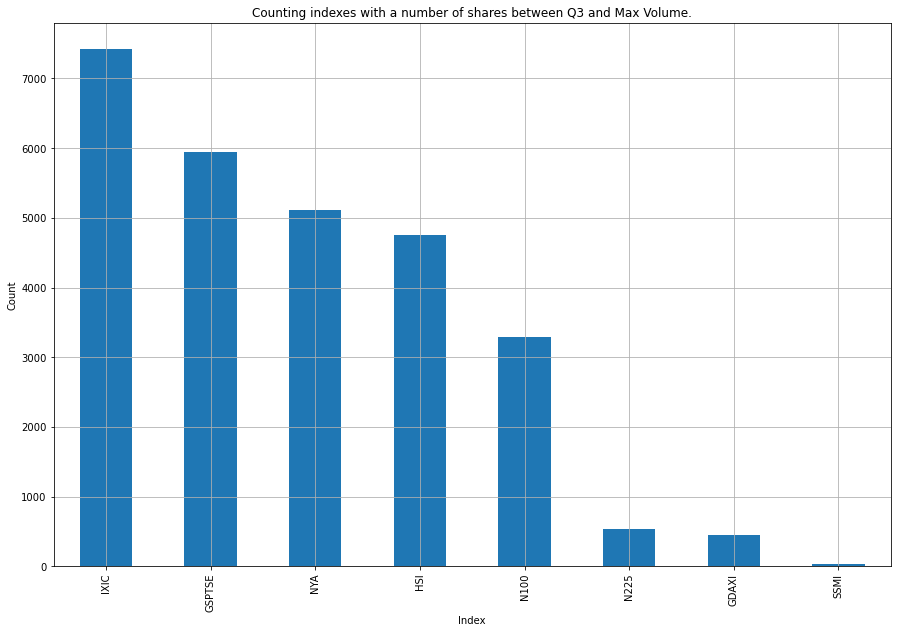

In [17]:
plt.figure(figsize=(15,10))
df_lots_volume.Index.value_counts().plot(kind='bar')
plt.ylabel('Count')

plt.xlabel('Index')
plt.title('Counting indexes with a number of shares between Q3 and Max Volume.')
plt.grid()

plt.savefig('Counting indexes with a number of shares between Q3 and Max Volume.jpg')
plt.show()

## Overview comparison about Open and Close indexes values over the time.

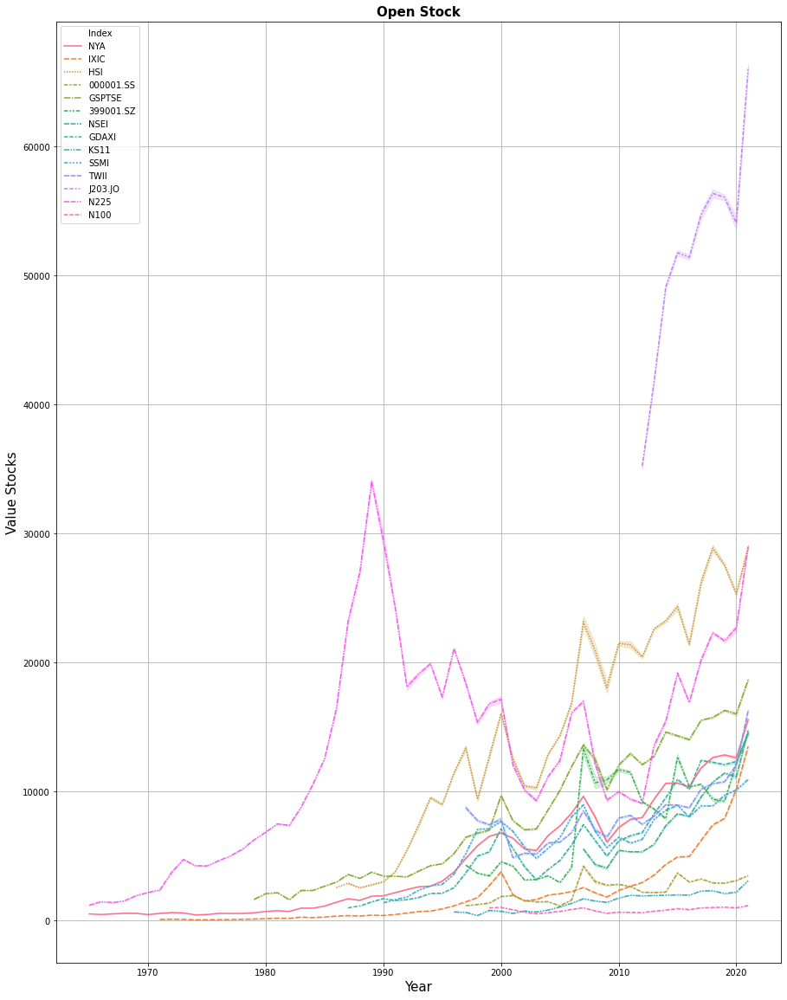

In [18]:
plt.figure(figsize=(15,20))
sns.lineplot(data=data_info_df, x="Year", y="Open", hue="Index", style="Index")

plt.title("Open Stock", fontsize=15, fontweight='bold')
plt.xlabel("Year", fontsize=15)
plt.ylabel("Value Stocks", fontsize=15)
plt.grid()

plt.savefig('Open Stock.jpg', dpi=300)
plt.show()

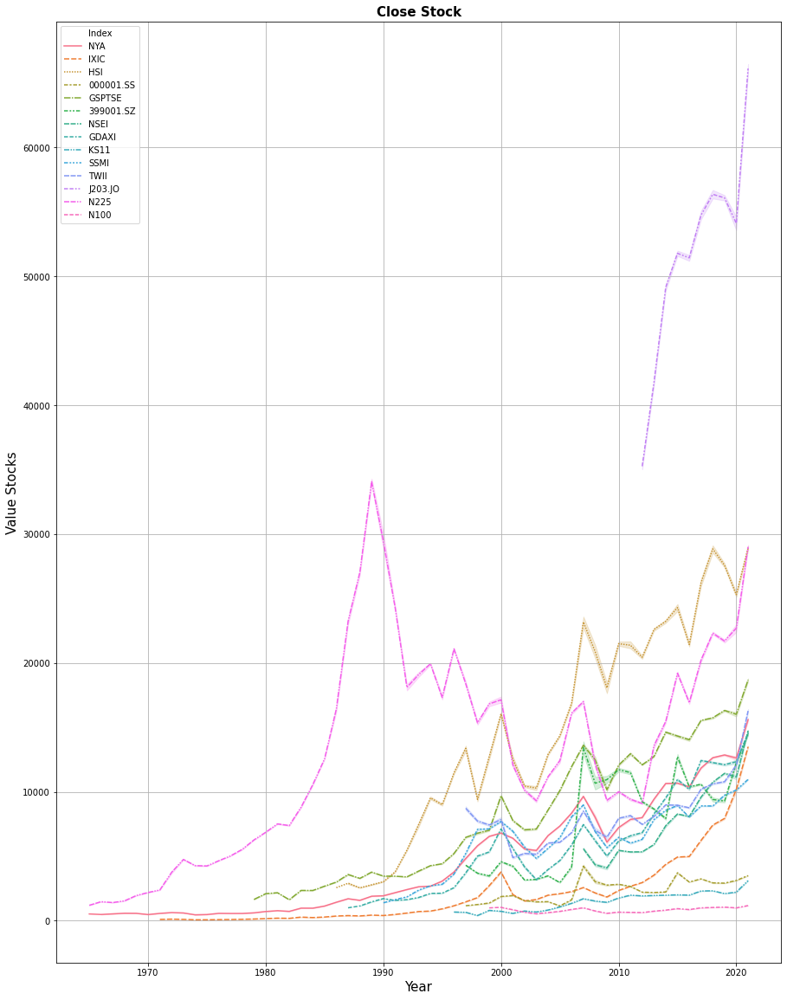

In [19]:
plt.figure(figsize=(15,20))
sns.lineplot(data=data_info_df, x="Year", y="Close", hue="Index", style="Index")

plt.title("Close Stock", fontsize=15, fontweight='bold')
plt.xlabel("Year", fontsize=15)
plt.ylabel("Value Stocks", fontsize=15) 
plt.grid()
plt.savefig('Close Stock.jpg', dpi=300)
plt.show()

## Filtering the dataframe: Europe and Switzerland comparison.

In [20]:
eu_swiss_df = data_info_df[data_info_df['Region'].isin(['Europe','Switzerland'])] 

# Comparison between the two indexes on the volume.

## Hint: In RGB, each of the red/green/blue light levels is encoded as a number in the range 0 .. 255. This site helps you to translate your color into HEX-code (https://www.rapidtables.com/web/color/RGB_Color.html)

In [21]:
sw_date = eu_swiss_df.loc[eu_swiss_df['Region']=='Switzerland'].Date.to_list()
sw_volume = eu_swiss_df.loc[eu_swiss_df['Region']=='Switzerland'].Volume.to_list()
eu_date = eu_swiss_df.loc[eu_swiss_df['Region']=='Europe'].Date.to_list()
eu_volume = eu_swiss_df.loc[eu_swiss_df['Region']=='Europe'].Volume.to_list()

fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Scatter(x=eu_date, y=eu_volume, name='Europe'),
    row=1, col=1)       
fig.add_trace(
    go.Scatter(x=sw_date, y=sw_volume, name='Switzerland'),
    row=1, col=2)

fig.update_layout(height=600, width=1000, title_text="<b>Side By Side Volume EU vs Swiss</b>", title_x=0.5)

fig.write_image(path+"Side By Side Volume EU vs Swiss.jpg")
fig.show()

# Comparison between the two countries on the volume multiplied by the opening value.

In [22]:
fig = px.line(eu_swiss_df, x='Date', y="Total Volume", color='Region', color_discrete_map={"Europe":'#0000FF', "Switzerland":"#FF0000"})
fig.update_layout(xaxis_rangeslider_visible=False, title_text='<b>Total Volume Europe vs Switzerland</b>', title_x=0.5)
fig.write_image(path+"Total Volume Europe vs Switzerland.jpg")
fig.show()

# Comparison between the two indexes on the difference between the opening and closing value.

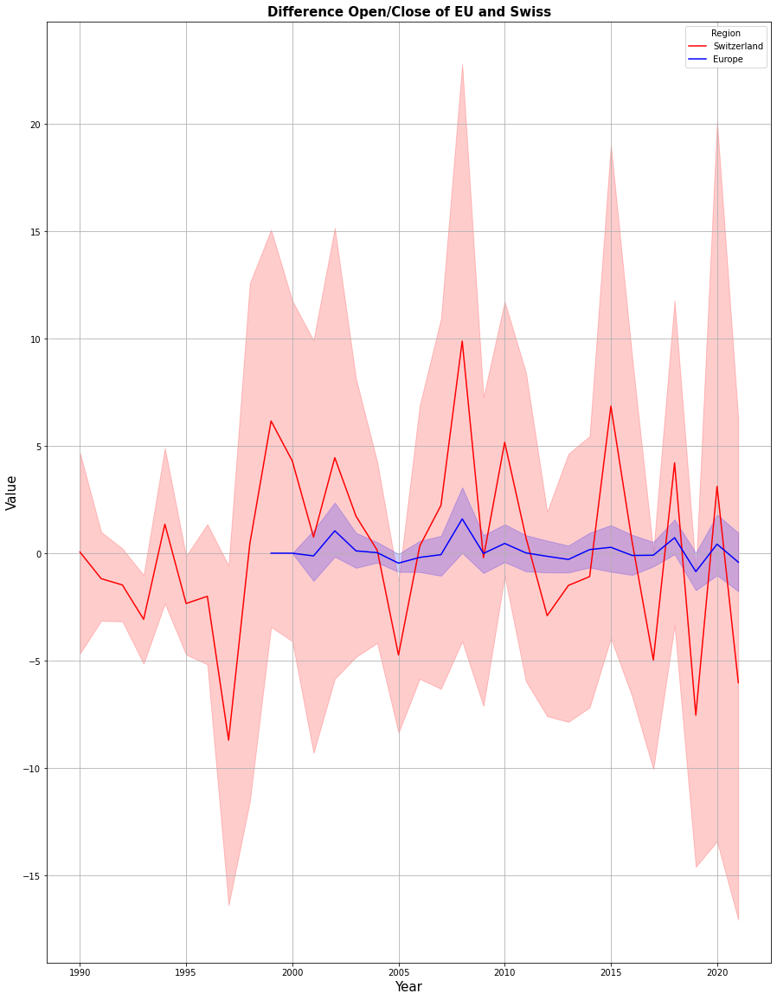

In [23]:
plt.figure(figsize=(15,20))
sns.lineplot(data=eu_swiss_df, 
             x="Year", 
             y="diff_open_close", 
             hue="Region", 
             palette={'Switzerland':"#FF0000", 'Europe':'#0000FF'})

plt.title("Difference Open/Close of EU and Swiss", fontsize=15, fontweight='bold')
plt.xlabel("Year", fontsize=15)
plt.ylabel("Value", fontsize=15)
plt.grid()

plt.savefig('Difference OpenClose of EU and Swisss.jpg', dpi=300)

# Descriptive statistics about diff_open_close and diff_high_low columns to have a general overview about the numbers:

In [24]:
eu_swiss_df[eu_swiss_df['Region']=='Europe'].diff_open_close.describe()

count    5474.000000
mean        0.107629
std         7.405786
min       -52.320007
25%        -3.739990
50%         0.000000
75%         3.570007
max        61.669983
Name: diff_open_close, dtype: float64

In [25]:
eu_swiss_df[eu_swiss_df['Region']=='Europe'].diff_high_low.describe()

count    5474.000000
mean        9.633025
std         6.712482
min         0.000000
25%         5.462509
50%         8.359985
75%        12.320008
max        72.229980
Name: diff_high_low, dtype: float64

In [26]:
eu_swiss_df[eu_swiss_df['Region']=='Switzerland'].diff_open_close.describe()

count    7671.000000
mean        0.279684
std        63.097716
min      -545.810547
25%       -28.850098
50%        -2.399902
75%        25.995117
max       882.059570
Name: diff_open_close, dtype: float64

In [27]:
eu_swiss_df[eu_swiss_df['Region']=='Switzerland'].diff_high_low.describe()

count    7671.000000
mean       78.859499
std        61.512405
min         0.000000
25%        40.900390
50%        65.499997
75%        99.699707
max      1345.010254
Name: diff_high_low, dtype: float64

# Comparison between the two indexes on the difference between the highest and lowest value.

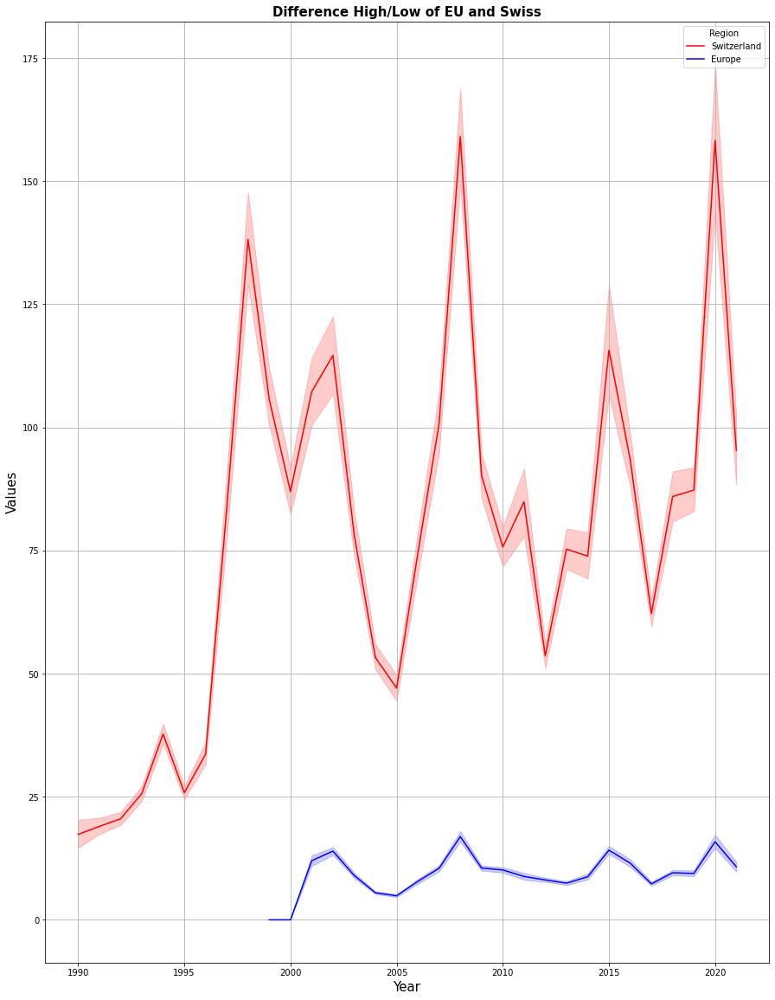

In [28]:
plt.figure(figsize=(15,20))
sns.lineplot(data=eu_swiss_df, 
             x="Year", 
             y="diff_high_low", 
             hue="Region", 
             palette={'Switzerland':"#FF0000", 'Europe':'#0000FF'})

plt.title("Difference High/Low of EU and Swiss", fontsize=15, fontweight='bold')
plt.xlabel("Year", fontsize=15)
plt.ylabel("Values", fontsize=15) 


plt.grid()
plt.savefig(path+'Difference HighLow of EU and Swiss.jpg', dpi=300)

# Which indices is more volatile?

<Figure size 1080x2160 with 0 Axes>

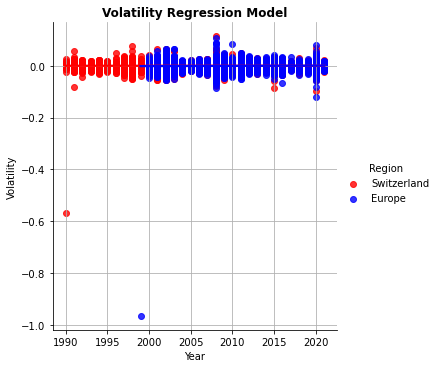

In [29]:
plt.figure(figsize=(15, 30))
sns.lmplot(data=eu_swiss_df, x='Year', y='Volatility', 
           hue='Region', 
           palette={'Switzerland':"#FF0000", 'Europe':'#0000FF'})


plt.title("Volatility Regression Model", fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Volatility")
plt.grid()
plt.savefig('Volatility Regression Model.jpg', dpi=300)
plt.show()

<Figure size 1080x2160 with 0 Axes>

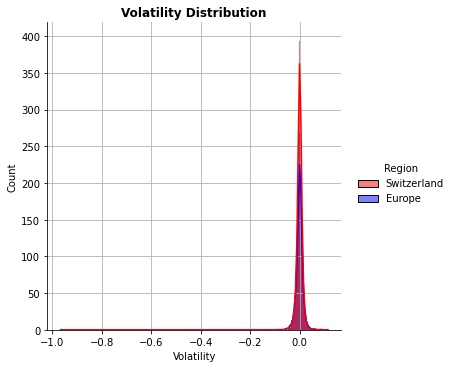

In [30]:
plt.figure(figsize=(15, 30))
sns.displot(data=eu_swiss_df, 
            x="Volatility", 
            kde=True, 
            hue='Region',
            palette={'Switzerland':"#FF0000", 'Europe':'#0000FF'})


plt.title("Volatility Distribution", fontweight='bold')
plt.xlabel("Volatility")
plt.ylabel("Count") 
plt.grid()
plt.savefig('Volatility Distribution.jpg', dpi=300)
plt.show()

## Descriptive statistics Volatility column. 

In [31]:
eu_swiss_df[eu_swiss_df.Region == 'Europe'].Volatility.describe()

count    5474.000000
mean       -0.000047
std         0.018518
min        -0.965586
25%        -0.005844
50%         0.000563
75%         0.006430
max         0.108731
Name: Volatility, dtype: float64

In [32]:
eu_swiss_df[eu_swiss_df.Region == 'Switzerland'].Volatility.describe()

count    7671.000000
mean        0.000265
std         0.013050
min        -0.569474
25%        -0.005194
50%         0.000651
75%         0.006164
max         0.113910
Name: Volatility, dtype: float64

# Through an OHLC, see the differences, if any.

In [33]:
sw = eu_swiss_df[eu_swiss_df['Region']=='Switzerland']

fig = go.Figure(data=[go.Ohlc(x=sw.Date, open=sw.Open, high=sw.High, low=sw.Low, close=sw.Close)])

fig.update_layout(xaxis_rangeslider_visible=False, title_text="<b>OHLC Switzerland.</b>", title_x=0.5)

fig.update_yaxes(linecolor = "black", title_text="Values")
fig.update_xaxes(linecolor = "black", title_text="Year")
fig.write_image(path+"OHLC Switzerland.jpg")
fig.show()

In [34]:
eu = eu_swiss_df[eu_swiss_df['Region']=='Europe']

fig = go.Figure(data=[go.Ohlc(x=eu.Date, open=eu.Open, high=eu.High, low=eu.Low, close=eu.Close)])

fig.update_layout(xaxis_rangeslider_visible=False, title_text="<b>OHLC Europe.</b>", title_x=0.5)
fig.update_yaxes(linecolor = "black", title_text="Values")
fig.update_xaxes(linecolor = "black", title_text="Year")
fig.write_image(path+"OHLC Europe.jpg")
fig.show()

# Evaluate the Results.

## How to calculate volatility, variance and standard deviation.

In [35]:
print('Switzerland:\n')
total_dev_sq_sw = sw['Deviation Squared'].sum()
variance_sw = total_dev_sq_sw / len(sw)
standard_deviation_sw = variance_sw**0.5
print(f'Total Deviation Squared {total_dev_sq_sw}')
print(f'Variance {total_dev_sq_sw}')
print(f'Standard Deviation {standard_deviation_sw}')
print('Standard Deviation is a measure of risk and shows how values are spread out around the avg price.')

Switzerland:

Total Deviation Squared 57634721683.436295
Variance 57634721683.436295
Standard Deviation 2741.0446423073677
Standard Deviation is a measure of risk and shows how values are spread out around the avg price.


In [36]:
print('Europe:\n')
total_dev_sq_eu = eu['Deviation Squared'].sum()
variance_eu = total_dev_sq_eu / len(eu)
standard_deviation_eu = variance_eu**0.5
print(f'Total Deviation Squared {total_dev_sq_eu}')
print(f'Variance {variance_eu}')
print(f'Standard Deviation {standard_deviation_eu}')
print('Standard Deviation is a measure of risk and shows how values are spread out around the avg price.')

Europe:

Total Deviation Squared 255939436447.266
Variance 46755468.843124956
Standard Deviation 6837.797075310509
Standard Deviation is a measure of risk and shows how values are spread out around the avg price.


In [37]:
fig = px.line(eu_swiss_df, x='Date', y='Returning Cumulative', color='Region')

fig.update_layout(title_text="<b>Returning Cumulative Europe and Switzerland.</b>", title_x=0.5)
fig.update_yaxes(linecolor = "black",
                title_text="Values")
fig.update_xaxes(linecolor = "black",
                title_text="Year")
fig.write_image(path+"Returning Cumulative Europe and Switzerland.jpg")
fig.show()

# Which indices has the most high value in return investment.

### Calculating Europe profit.

In [38]:
eu_line = eu_swiss_df[['Returning Cumulative']][eu_swiss_df['Region']=='Europe']
profit_eu = (eu_line['Returning Cumulative'].iloc[-1] / eu_line['Returning Cumulative'].iloc[0]) - 1

### Calculating Switzerland profit.

In [39]:
sw_line = eu_swiss_df[['Returning Cumulative']][eu_swiss_df['Region']=='Switzerland']
profit_sw = (sw_line['Returning Cumulative'].iloc[-1] / sw_line['Returning Cumulative'].iloc[0]) - 1

In [40]:
print(f"Profit Switzerland: {profit_sw}")
print(f"Profit Europe: {profit_eu}")

Profit Switzerland: 7.2374382436006
Profit Europe: 0.26361999499999933


## Descriptive statistics of the two indexes about Returning Cumulative column.

In [41]:
eu_swiss_df[['Returning Cumulative']][eu_swiss_df['Region']=='Switzerland'].describe()

,Returning Cumulative
count,7671.000000
mean,12.123802
std,4.616524
min,2.435454
25%,9.613573
50%,12.576557
75%,15.661777
max,21.612193


In [42]:
eu_swiss_df[['Returning Cumulative']][eu_swiss_df['Region']=='Europe'].describe()

,Returning Cumulative
count,5474.000000
mean,1.555077
std,0.343024
min,0.794322
25%,1.256355
50%,1.567696
75%,1.862136
max,2.390096
